In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from collections import Counter
import warnings 
warnings.simplefilter(action = 'ignore') 

In [2]:
df = pd.read_csv(r"C:\Users\HP\Downloads\Indicino project.xlsx - Attrition_data.csv")
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13   JobInvolvement           1470 non-null   object
 14  JobLevel                

In [4]:
pip install ydata-profiling

Note: you may need to restart the kernel to use updated packages.


In [5]:
profile = ProfileReport(df, explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df.shape

(1470, 35)

In [7]:
# Handling outliers in numerical columns using z-scores method

# upon examining our dataset, we noticed that all numerical columns indicate no outliers

In [8]:
category = df.select_dtypes(include = ['object', 'category']).columns

print(category)

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       ' JobInvolvement ', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime'],
      dtype='object')


In [9]:
encoder = LabelEncoder()
df['Attrition'] = encoder.fit_transform(df['Attrition'])


categorical_cols = ['BusinessTravel', 'Department', 'EducationField', 'Gender', ' JobInvolvement ', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime']

for cols in categorical_cols:
    df[cols] = encoder.fit_transform(df[cols])

In [10]:
X = df.drop(columns = ['Attrition', 'StandardHours', 'Over18', 'EmployeeNumber', 'EmployeeCount'], axis = 1)

In [11]:
y=df['Attrition']

In [12]:
y.head()

0    1
1    0
2    1
3    0
4    0
Name: Attrition, dtype: int32

In [13]:
#  (X = features, y = target variable)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [14]:
model = RandomForestClassifier(max_depth = 15, min_samples_split = 15, criterion = 'gini', random_state = 42)

model.fit(X_train, y_train)

RandomForestClassifier(max_depth=15, min_samples_split=15, random_state=42)

In [15]:
y_pred = model.predict(X_test)

In [16]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Visualize it
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix Before Resampling")
plt.show()

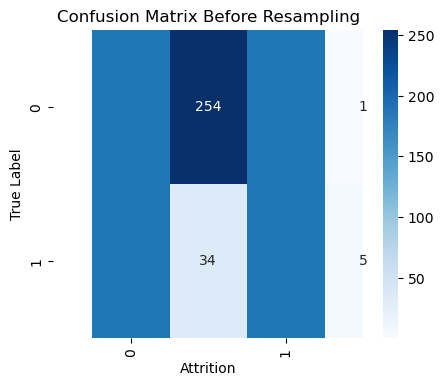

In [17]:
%matplotlib inline
import matplotlib.pyplot as plt

y.value_counts().plot(kind='bar')
plt.show()

In [18]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)


X__resampled, y_resampled = smote.fit_resample(X, y)


print("Before SMOTE:", y.value_counts())  # Class distribution before SMOTE
print("After SMOTE:", y_resampled.value_counts())  # Class distribution after S




Before SMOTE: Attrition
0    1233
1     237
Name: count, dtype: int64
After SMOTE: Attrition
1    1233
0    1233
Name: count, dtype: int64


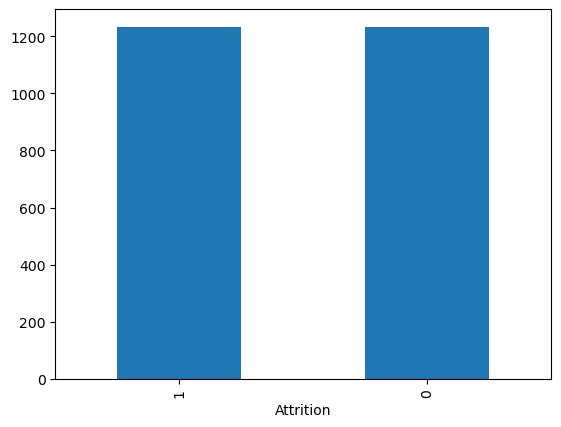

In [19]:
y_resampled.value_counts().plot(kind='bar')
plt.show()

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X__resampled, y_resampled, test_size=0.2, random_state=42)


In [21]:
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=15, min_samples_split=15, random_state=42)

In [22]:
y_pred_resampled = model.predict(X_test)

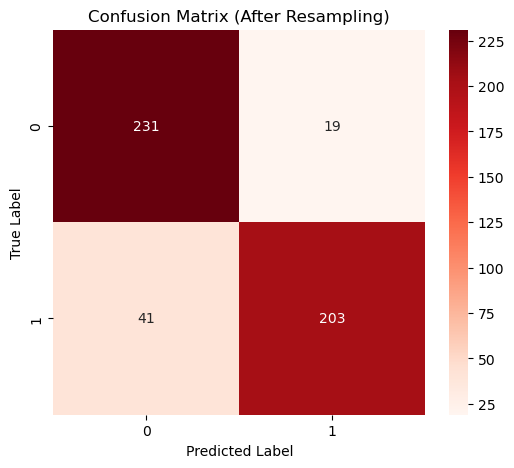

In [23]:

# Compute the confusion matrix
cm_resampled = confusion_matrix(y_test, y_pred_resampled)

# Plot the confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm_resampled, annot=True, fmt="d", cmap="Reds", xticklabels=[0, 1], yticklabels=[0, 1], cbar=True)
plt.title('Confusion Matrix (After Resampling)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()



In [24]:
print(f"y_pred shape: {y_pred.shape}") 

y_pred shape: (294,)


In [25]:
# Resampling changes only the training data (e.g., X_train_resampled, y_train_resampled), but your test data (X_test, y_test) remains the same.
# Some models, like Decision Trees, can still favor the majority class even after resampling.


In [26]:
print(y_test.shape, y_pred.shape)

(494,) (294,)


In [27]:
# Classification Accuracy

from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Cross-validation accuracy
scores = cross_val_score(model, X, y, cv=5, scoring="accuracy")
print(f'Cross-Validation Accuracy: {scores.mean():.2f}')


accuracy = accuracy_score(y_test, y_pred_resampled)
precision = precision_score(y_test, y_pred_resampled)  
recall = recall_score(y_test, y_pred_resampled)
f1 = f1_score(y_test, y_pred_resampled)

# Compute ROC-AUC using predicted probabilities
y_pred_probs = model.predict_proba(X_test)[:, 1]  # Get probabilities for class 1
roc_auc = roc_auc_score(y_test, y_pred_probs)  

# Print results
print(f'Classification Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'ROC_AUC: {roc_auc:.2f}')

Cross-Validation Accuracy: 0.86
Classification Accuracy: 0.88
Precision: 0.91
Recall: 0.83
F1 Score: 0.87
ROC_AUC: 0.95


In [28]:
print("Unique values in y_resampled:", set(y_resampled))

Unique values in y_resampled: {0, 1}


In [29]:
print("Type of y_test:", type(y_test))
print("Type of y_pred:", type(y_pred))

Type of y_test: <class 'pandas.core.series.Series'>
Type of y_pred: <class 'numpy.ndarray'>


In [30]:
train_accuracy = model.score(X_train, y_train)

print(f"Train Accuracy: {train_accuracy:.2%}")


Train Accuracy: 97.77%


In [31]:
print(f'Test Accuracy: {accuracy:.2%}')  

Test Accuracy: 87.85%


In [32]:
print(f"X_test shape: {X_test}")  
print(f"y_test shape: {y_test}")

X_test shape:       Age  BusinessTravel  DailyRate  Department  DistanceFromHome  Education  \
1078   44               2        136           1                28          3   
1281   35               2        303           2                27          3   
621    36               2        928           2                 1          2   
1508   29               1        336           1                15          1   
1975   43               0        741           0                27          3   
...   ...             ...        ...         ...               ...        ...   
2099   47               2       1073           1                 7          3   
1836   29               0        477           1                23          2   
303    31               2        218           2                 7          3   
1864   25               1       1123           1                 3          3   
141    45               2       1316           1                29          3   

      Educati

# HYPERPARAMETER TUNING



In [34]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Define the model
model = RandomForestClassifier(random_state=42)

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 200],          # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],         # Depth of each tree
    'min_samples_split': [2, 5, 10],         # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],           # Minimum samples required at a leaf node
    'max_features': ['sqrt', 'log2'],        # Number of features to consider at each split
    'class_weight': ['balanced', None]       # Handle class imbalance
}

# Initialize GridSearchCV (Exhaustive Search)
random_search = RandomizedSearchCV(model, param_grid, n_iter=50, cv=5, scoring='f1', n_jobs=-1, verbose=2, random_state=42)
# Fit on training data
random_search.fit(X__resampled, y_resampled)


# Evaluate the best model
best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)

# Print classification report
print(classification_report(y_test, y_pred))

Fitting 5 folds for each of 50 candidates, totalling 250 fits
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       250
           1       0.98      0.99      0.99       244

    accuracy                           0.99       494
   macro avg       0.99      0.99      0.99       494
weighted avg       0.99      0.99      0.99       494



In [35]:
print("Best Hyperparameters:", random_search.best_params_)  
print("Best Score:", random_search.best_score_)  

Best Hyperparameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 10, 'class_weight': None}
Best Score: 0.8892839127223503


In [36]:
best_model = random_search.best_estimator_  
y_pred = best_model.predict(X_test)  

In [37]:
from sklearn.metrics import classification_report, confusion_matrix  

print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))  
print("Classification Report:\n", classification_report(y_test, y_pred))  


Confusion Matrix:
 [[245   5]
 [  2 242]]
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.99       250
           1       0.98      0.99      0.99       244

    accuracy                           0.99       494
   macro avg       0.99      0.99      0.99       494
weighted avg       0.99      0.99      0.99       494



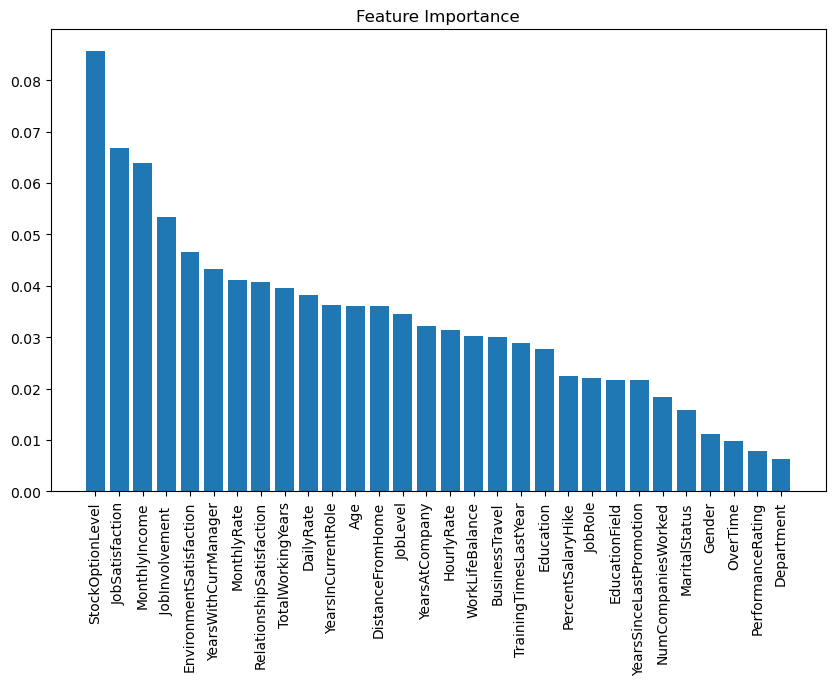

In [38]:
import matplotlib.pyplot as plt
import numpy as np

feature_importances = best_model.feature_importances_
sorted_indices = np.argsort(feature_importances)[::-1]  # Sort in descending order

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_importances)), feature_importances[sorted_indices])
plt.xticks(range(len(feature_importances)), X_train.columns[sorted_indices], rotation=90)
plt.title("Feature Importance")
plt.show()

In [39]:
print("Train Accuracy:", best_model.score(X_train, y_train))
print("Test Accuracy:", best_model.score(X_test, y_test))

Train Accuracy: 0.9939148073022313
Test Accuracy: 0.9858299595141701


In [40]:
pd.set_option('display.max_columns', None)
print(X.head())

   Age  BusinessTravel  DailyRate  Department  DistanceFromHome  Education  \
0   41               2       1102           2                 1          2   
1   49               1        279           1                 8          1   
2   37               2       1373           1                 2          2   
3   33               1       1392           1                 3          4   
4   27               2        591           1                 2          1   

   EducationField  EnvironmentSatisfaction  Gender  HourlyRate  \
0               1                        2       0          94   
1               1                        3       1          61   
2               4                        4       1          92   
3               1                        4       0          56   
4               3                        1       1          40   

    JobInvolvement   JobLevel  JobRole  JobSatisfaction  MaritalStatus  \
0                 2         2        7                4     

In [95]:
new_data = [[36, 2, 1973, 1, 2, 1, 4, 4, 1, 95, 1, 2, 3, 3, 3, 2190, 2596, 6, 4, 15, 3, 2, 1, 9, 3, 3, 0, 1, 1, 2]]
predictions = best_model.predict(new_data)
print("🔮 Predictions:", predictions)


🔮 Predictions: [0]
